<a href="https://colab.research.google.com/github/ardilalukita14/PCVK-Genap-21-22/blob/main/PROJECT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
# import library yang akan dibutuhkan dalam praktikum

import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
from matplotlib import pyplot as plt
import math

In [4]:
# akses drive
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


## **SOBEL**

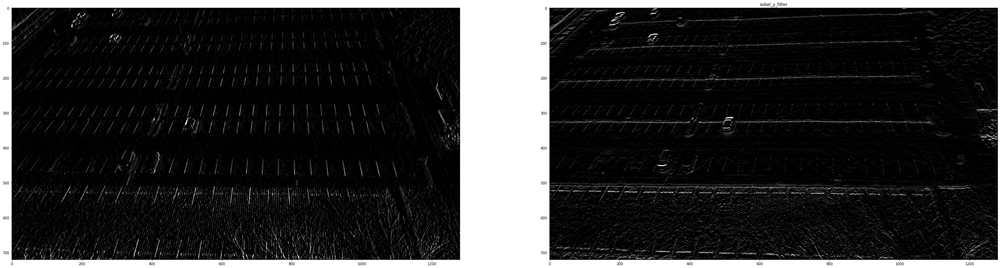

In [5]:
image = cv.imread('/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-09-16_07_57_59.jpg', cv.IMREAD_COLOR)
image_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

filtered_image_y = cv.filter2D(image_gray, -1, sobel_y)
filtered_image_x = cv.filter2D(image_gray, -1, sobel_x)

f, axarr = plt.subplots(1,2, figsize=(50, 25)) 
axarr[0].imshow(filtered_image_x, cmap='gray'), axarr[1].set_title("sobel_x_filter")
axarr[1].imshow(filtered_image_y, cmap='gray'), axarr[1].set_title("sobel_y_filter")
plt.show()

## **Canny**

(<matplotlib.image.AxesImage at 0x7f8861888210>,
 Text(0.5, 1.0, 'Canny Edge Detection'))

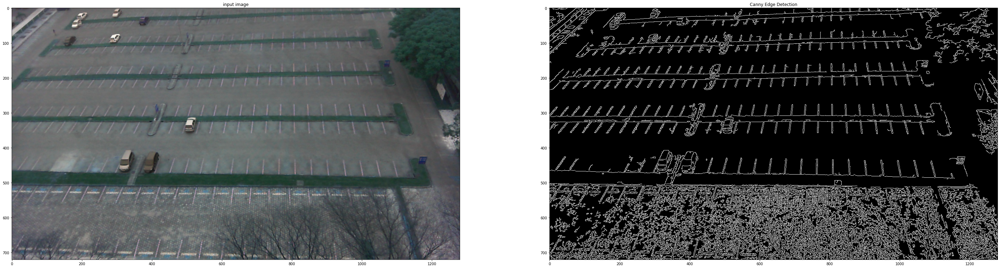

In [6]:
image = cv.imread('/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-09-16_07_57_59.jpg', cv.IMREAD_COLOR)

image_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
filtered_image = cv.Canny(image_gray, threshold1=20, threshold2=80)

f, axarr = plt.subplots(1,2, figsize=(50, 25)) 
axarr[0].imshow(image), axarr[0].set_title("input image")
axarr[1].imshow(filtered_image, cmap='gray'), axarr[1].set_title("Canny Edge Detection")

## **Laplacian**

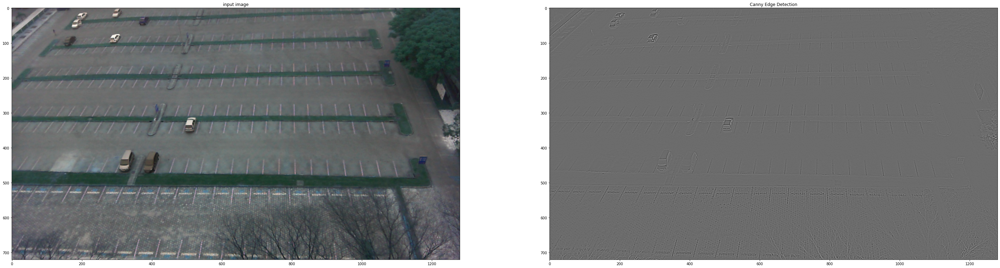

In [7]:
img = cv.imread('/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-09-16_07_57_59.jpg', cv.IMREAD_COLOR)
image_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
# memanggil fungsi Canny Edges dengan argument (citra, nilai_min, nilai_max)
laplacian = cv.Laplacian(image_gray,cv.CV_64F)

f, axarr = plt.subplots(1,2, figsize=(50, 25)) 
axarr[0].imshow(img, cmap = 'gray'), axarr[0].set_title("input image")
axarr[1].imshow(laplacian, cmap = 'gray'), axarr[1].set_title("Canny Edge Detection")


plt.show()

## **Haar Cascade**

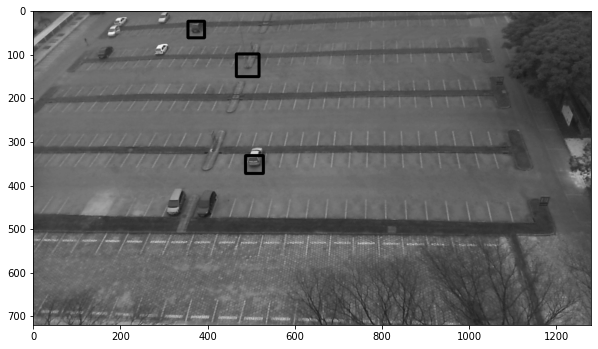

In [8]:
cascade_car = cv.CascadeClassifier('/content/drive/MyDrive/PCVK_PROJECT/cars.xml')

image = cv.imread('/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-09-16_07_57_59.jpg', 0)
image_car = cascade_car.detectMultiScale(image)
for (x,y,w,h) in image_car:
    cv.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 5)

plt.figure(figsize = (10, 10))
plt.imshow(image, cmap='gray')


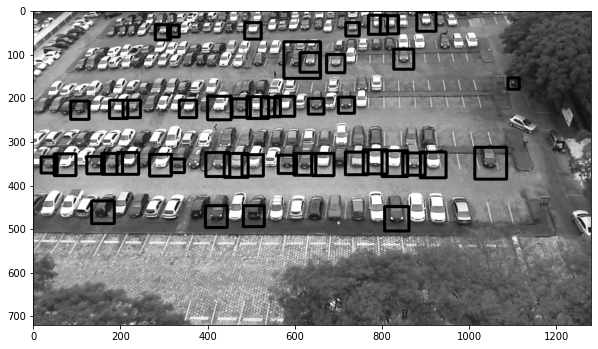

In [9]:
cascade_car = cv.CascadeClassifier('/content/drive/MyDrive/PCVK_PROJECT/cars.xml')

image = cv.imread('/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-11-10_08_47_45.jpg', 0)
image_car = cascade_car.detectMultiScale(image)
for (x,y,w,h) in image_car:
    cv.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 5)

plt.figure(figsize = (10, 10))
plt.imshow(image, cmap='gray')


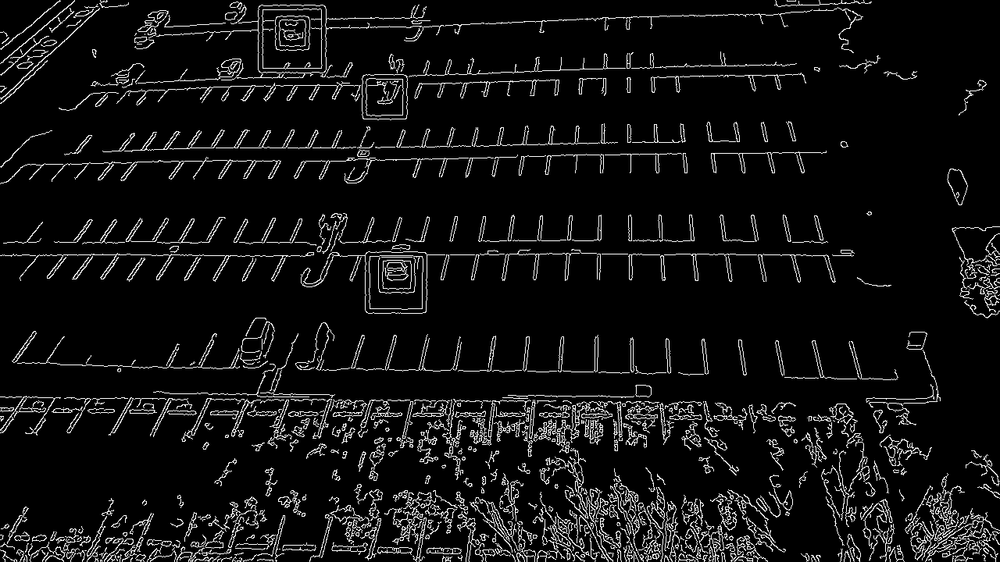

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [14]:
img = cv.imread(filename='/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-09-16_07_57_59.jpg')
gray = cv.cvtColor(src=img, code=cv.COLOR_BGR2GRAY)

cascade_car = cv.CascadeClassifier('/content/drive/MyDrive/PCVK_PROJECT/cars.xml')
cars = cascade_car .detectMultiScale(gray)
for(x,y,w,h) in cars: 
 cv.rectangle(gray,(x,y),(x+w,y+h),(0,255,0),3) 
plt.figure(figsize = (10,10))

blur_gray = cv.GaussianBlur(src=gray, ksize=(5, 5), sigmaX=0)
cars = cascade_car.detectMultiScale(blur_gray)
for(x,y,w,h) in cars: 
 cv.rectangle(blur_gray,(x,y),(x+w,y+h),(0,255,0),3) 
plt.figure(figsize = (10,10))

edges = cv.Canny(image=blur_gray, threshold1=20, threshold2=80, apertureSize=3)
for(x,y,w,h) in cars: 
 cv.rectangle(blur_gray,(x,y),(x+w,y+h),(0,255,0),3) 
plt.figure(figsize = (10,10))
cv2_imshow(cv.cvtColor(edges,cv.COLOR_BGR2RGB))

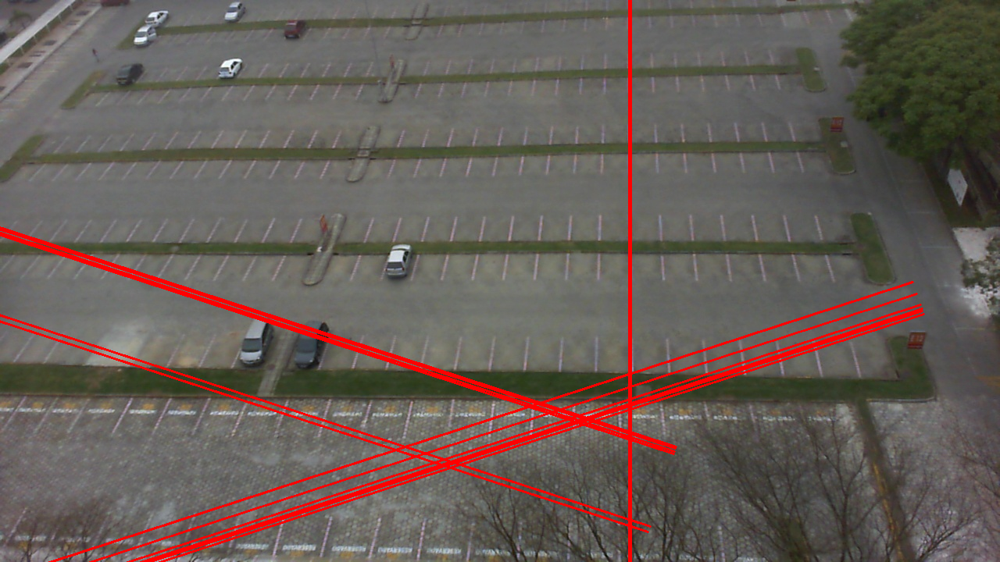

In [13]:
image1 = cv.imread('/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-09-16_07_57_59.jpg')
gray=cv.cvtColor(image1,cv.COLOR_BGR2GRAY)
dst = cv.Canny(gray, 70, 140)

lines= cv.HoughLines(dst, 1, np.pi/5, 100)
#lines1 = cv2.HoughLines(image1,1,math.pi/180,5)
#lines2 = cv2.HoughLines(image2,1,math.pi/180,5)

#lines1 = lines1[0]
#lines2 = lines2[0]

a,b,c = lines.shape
for i in range(a):
    rho = lines[i][0][0]
    theta = lines[i][0][1]
    a = math.cos(theta)
    b = math.sin(theta)
    x0, y0 = a*rho, b*rho
    pt1 = ( int(x0+1000*(-b)), int(y0+1000*(a)) )
    pt2 = ( int(x0-1000*(-b)), int(y0-1000*(a)) )
    cv.line(image1, pt1, pt2, (0, 0, 255), 2)


cv2_imshow(image1)

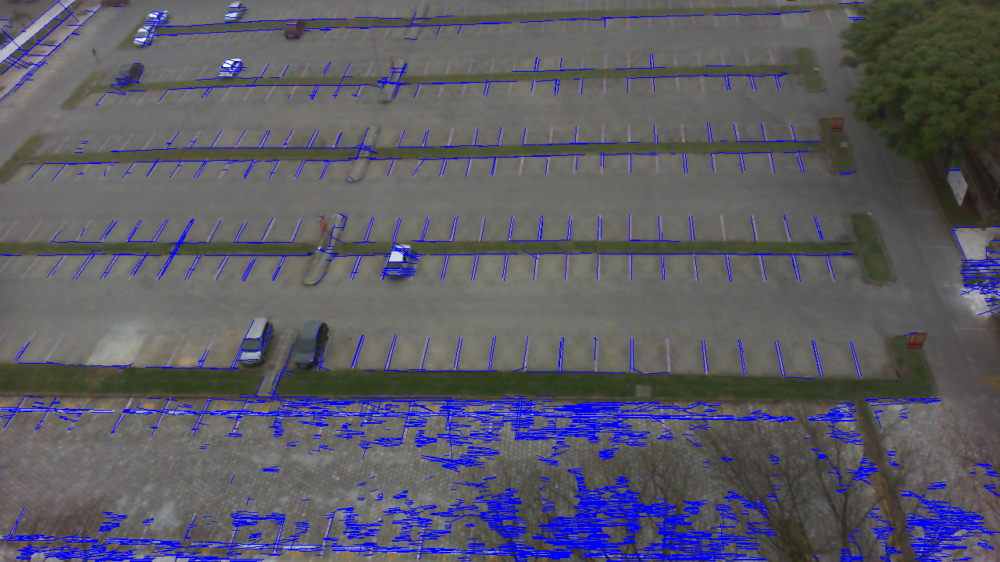

In [58]:
img = cv.imread('/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-09-16_07_57_59.jpg', cv.IMREAD_COLOR) # road.png is the filename
# Convert the image to gray-scale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
# Find the edges in the image using canny detector
edges = cv.Canny(gray, 40, 150)
# Detect points that form a line
lines = cv.HoughLinesP(edges, 1, np.pi/180, 40, minLineLength=5, maxLineGap=8)
# Draw lines on the image
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv.line(img, (x1, y1), (x2, y2), (255, 0, 0), 1)
# Show result
cv2_imshow(img)

number of Hough lines: 34
Number of filtered lines: 1
Number of filtered lines: 2
Number of filtered lines: 3
Number of filtered lines: 3
Number of filtered lines: 3
Number of filtered lines: 4
Number of filtered lines: 4
Number of filtered lines: 4
Number of filtered lines: 4
Number of filtered lines: 4
Number of filtered lines: 4
Number of filtered lines: 4
Number of filtered lines: 5
Number of filtered lines: 5
Number of filtered lines: 5
Number of filtered lines: 5
Number of filtered lines: 6
Number of filtered lines: 7
Number of filtered lines: 7
Number of filtered lines: 7
Number of filtered lines: 8
Number of filtered lines: 8
Number of filtered lines: 8
Number of filtered lines: 8
Number of filtered lines: 8
Number of filtered lines: 8
Number of filtered lines: 8
Number of filtered lines: 9
Number of filtered lines: 9
Number of filtered lines: 10
Number of filtered lines: 11
Number of filtered lines: 12
Number of filtered lines: 12
Number of filtered lines: 12


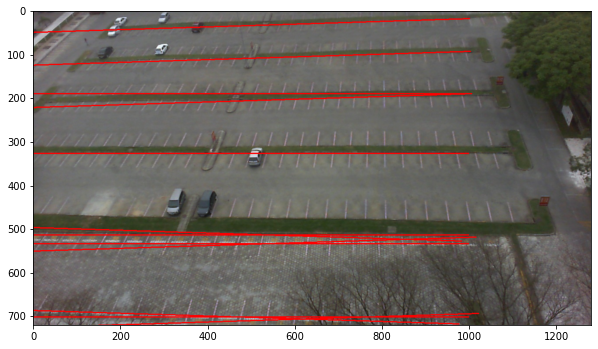

In [23]:
imageori = cv.imread('/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-09-16_07_57_59.jpg')
gray = cv.cvtColor(imageori,cv.COLOR_BGR2GRAY)
edges = cv.Canny(gray,50,150,apertureSize=3)
lines = cv.HoughLines(edges,1,np.pi/100,200)


if not lines.any():
    print('No lines were found') 
    exit()

if filter:
    rho_threshold = 15 
    theta_threshold = 10

 
    similar_lines = {i : [] for i in range(len(lines))} 
    for i in range(len(lines)): 
      for j in range (len (lines)): 
        if i == j: 
            continue

        rho_i, theta_i = lines[i][0] 
        rho_j, theta_j = lines[j][0] 
        if abs(rho_i - rho_j) < rho_threshold and abs (theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)


    indices = [i for i in range(len(lines))] 
    indices.sort(key=lambda x: len(similar_lines[x]))

    line_flags = len(lines) *[True] 
    for i in range(len(lines) - 1): 
        if not line_flags [indices[i]]: 
            continue

        for j in range(i + 1, len(lines)): 
            if not line_flags[indices[j]]:
                continue
            rho_i, theta_i = lines[indices[i]][0] 
            rho_j, theta_j = lines[indices[j]][0] 
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags [indices[j]] = False
    print('number of Hough lines:', len(lines))
    
    filtered_lines = []

    if filter:
        for i in range(len(lines)): 
            if line_flags[i]:
                filtered_lines.append(lines[i])

            print('Number of filtered lines:', len(filtered_lines )) 
    else:
        filtered_lines = lines

    for line in filtered_lines:
        rho, theta = line [0] 
        a = np.cos(theta) 
        b = np.sin(theta) 
        x0 = a*rho 
        y0 = b*rho 
        x1 = int(x0 + 1000*(-b)) 
        y1 = int(y0 + 1000*(a)) 
        x2 = int(x0 - 1000*(-b)) 
        y2 = int(y0 - 1000*(a))

        cv.line(imageori, (x1, y1), (x2,y2),(0,0,255),2)

    plt.figure(figsize=(10, 8)) 
    plt.imshow(cv.cvtColor(imageori, cv.COLOR_BGR2RGB))

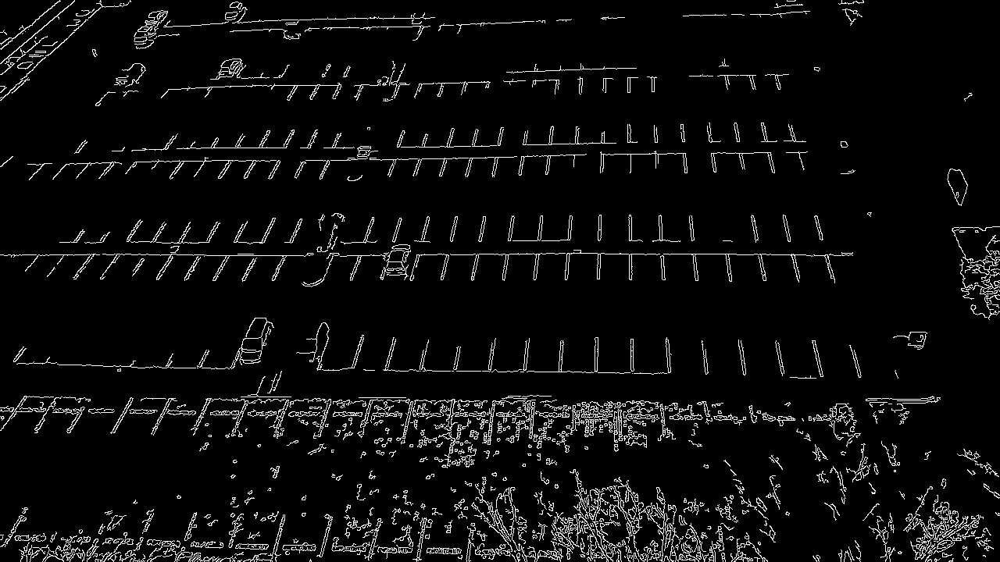

In [21]:
img = cv.imread('/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-09-16_07_57_59.jpg')
gray=cv.cvtColor(img,cv.COLOR_BGR2GRAY)
canimg = cv.Canny(gray, 55, 140)
 
# Show result
cv2_imshow(canimg)

(<matplotlib.image.AxesImage at 0x7f885e55c9d0>, Text(0.5, 1.0, 'Grid Image'))

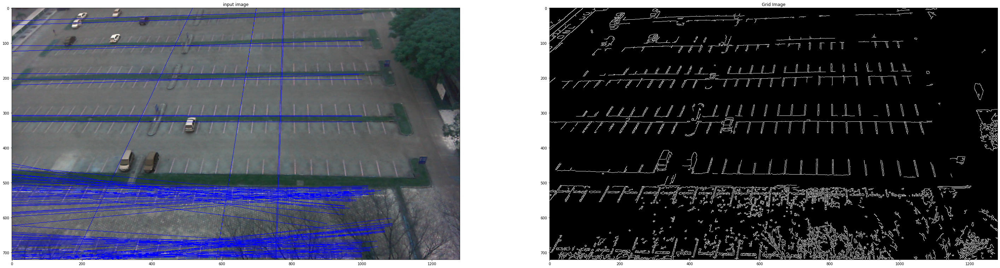

In [56]:
image1 = cv.imread('/content/drive/MyDrive/PCVK_PROJECT/CarPark/2012-09-16_07_57_59.jpg')
gray=cv.cvtColor(image1,cv.COLOR_BGR2GRAY)
canimg = cv.Canny(gray, 55, 140)
lines= cv.HoughLines(canimg, 1, np.pi/100.0, 150, np.array([]))
 
 
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))
 
    cv.line(image1,(x1,y1),(x2,y2),(0,0,255),1)
 

f, axarr = plt.subplots(1,2, figsize=(50, 25)) 
axarr[0].imshow(image1, cmap = 'gray'), axarr[0].set_title("input image")
axarr[1].imshow(canimg, cmap = 'gray'), axarr[1].set_title("Grid Image")
#cv2_imshow(image1)
#cv2_imshow(canimg)
